What is Degenerative Spine Disease?<br>
 Degenerative spine diseases involve the gradual loss of normal function and structure of the spine. Although mostly caused by aging, factors like tumors, arthritis, and infections can also exacerbate or cause it. The pressure on the nerve roots and the spinal cord due to degeneration can result from: Spinal stenosis: When the spinal canal starts narrowing Herniated or slipped discs Osteoarthritis: A condition where the cartilage in the spinal cord starts breaking down

In [2]:
import numpy as np
import pandas as pd
import os
import time
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import pydicom as dicom
import pydicom
import json
import glob
import collections
from pydicom.pixel_data_handlers.util import apply_voi_lut
import cv2
from skimage import measure
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import plotly.graph_objects as go
import random
from glob import glob
import warnings
warnings.filterwarnings('ignore')

In [3]:
label_coordinates_df = pd.read_csv('kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv')
train_series = pd.read_csv('kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_series_descriptions.csv')
df_train = pd.read_csv('kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train.csv')
df_sub = pd.read_csv('kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv')
test_series = pd.read_csv('kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/test_series_descriptions.csv')

In [4]:
label_coordinates_df.head()


,study_id,series_id,instance_number,condition,level,x,y
0,4003253,702807833,8,Spinal Canal Stenosis,L1/L2,322.831858,227.964602
1,4003253,702807833,8,Spinal Canal Stenosis,L2/L3,320.571429,295.714286
2,4003253,702807833,8,Spinal Canal Stenosis,L3/L4,323.030303,371.818182
3,4003253,702807833,8,Spinal Canal Stenosis,L4/L5,335.292035,427.327434
4,4003253,702807833,8,Spinal Canal Stenosis,L5/S1,353.415929,483.964602


In [5]:
label_coordinates_df.shape


(48692, 7)

In [6]:
folder_path = 'kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1012284084'
dicom_files = [f for f in os.listdir(folder_path) if f.endswith('.dcm')]

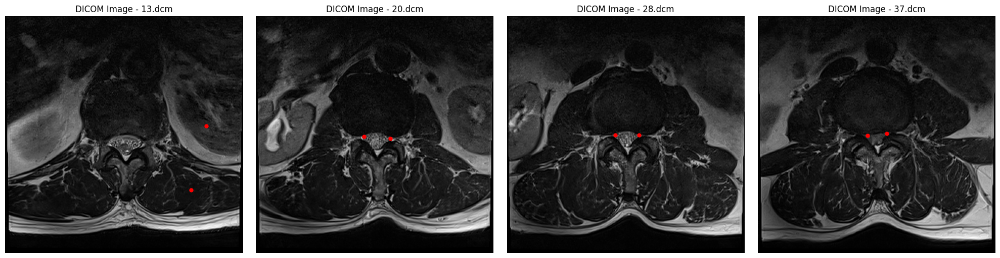

In [8]:
folder_path = 'kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1012284084'
dicom_files = [f for f in os.listdir(folder_path) if f.endswith('.dcm')]
label_coordinates_df = pd.read_csv('kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv')

study_id = folder_path.split('/')[-2]
study_label_coordinates = label_coordinates_df[label_coordinates_df['study_id'] == int(study_id)]
filtered_dicom_files = []
filtered_label_coordinates = []

for dicom_file in dicom_files:
    instance_number = int(dicom_file.split('.')[0])
    corresponding_coordinates = study_label_coordinates[study_label_coordinates['instance_number'] == instance_number]
    if not corresponding_coordinates.empty:
        filtered_dicom_files.append(dicom_file)
        filtered_label_coordinates.append(corresponding_coordinates)
fig, axs = plt.subplots(1, 4, figsize=(20, 5))
second_row_index = 1
second_row_images = filtered_dicom_files[second_row_index : second_row_index + 4]
second_row_coordinates = filtered_label_coordinates[second_row_index : second_row_index + 4]

for i, (dicom_file, label_coordinates) in enumerate(zip(second_row_images, second_row_coordinates)):
    dicom_file_path = os.path.join(folder_path, dicom_file)
    dicom_data = pydicom.dcmread(dicom_file_path)
    image = dicom_data.pixel_array   
    axs[i].imshow(image, cmap='gray')
    axs[i].set_title(f'DICOM Image - {dicom_file}')
    axs[i].axis('off')   
    for _, row in label_coordinates.iterrows():
        axs[i].plot(row['x'], row['y'], 'ro', markersize=5) 
        
plt.tight_layout()
plt.show()

In [9]:
df_train.head()


,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,...,left_subarticular_stenosis_l1_l2,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1
0,4003253,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
1,4646740,Normal/Mild,Normal/Mild,Moderate,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Moderate,Moderate,Moderate,Normal/Mild
2,7143189,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
3,8785691,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild
4,10728036,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Normal/Mild


In [11]:
def load_dicom(path):
    dicom = pydicom.read_file(path)
    data = dicom.pixel_array
    data = data - np.min(data)
    if np.max(data) != 0:
        data = data / np.max(data)
    data = (data * 255).astype(np.uint8)
    return data

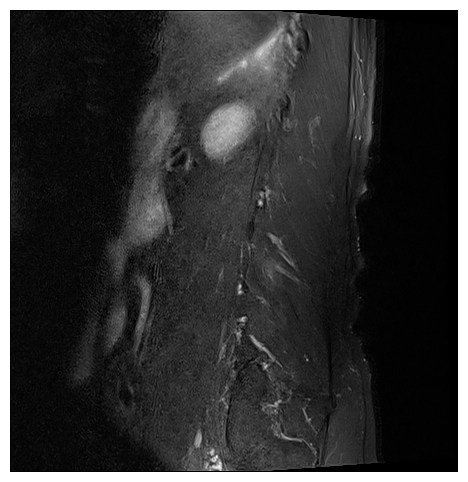

In [12]:
import glob
from matplotlib import animation, rc

rc('animation', html='jshtml')

def load_dicom(filename):
    ds = pydicom.dcmread(filename)
    return ds.pixel_array

def load_dicom_line(path):
    t_paths = sorted(
        glob.glob(os.path.join(path, "*")), 
        key=lambda x: int(os.path.splitext(os.path.basename(x))[0].split("-")[-1]),
    )
    images = []
    for filename in t_paths:
        data = load_dicom(filename)
        if data.max() == 0:
            continue
        images.append(data)
    return images

def create_animation(ims):
    fig = plt.figure(figsize=(6, 6))
    plt.axis('off')
    im = plt.imshow(ims[0], cmap="gray")

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval=1000//24)

path_to_folder = "kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1792451510"
images = load_dicom_line(path_to_folder)
anim = create_animation(images)
anim

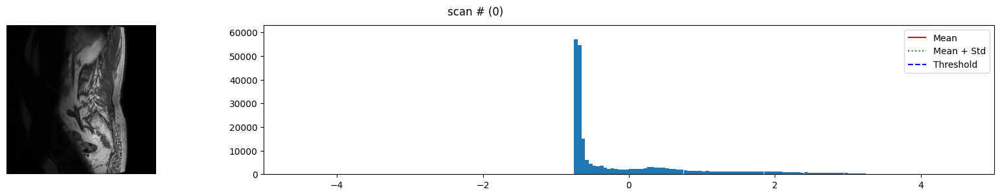

In [13]:
def read_dicom_files(path_to_folder, num_files=5):
    files_glob = os.path.join(path_to_folder, "*.dcm")
    dicom_files = sorted(glob.glob(files_glob), key=lambda f: int(os.path.splitext(os.path.basename(f))[0].split('-')[-1]))
    return [pydicom.dcmread(f) for f in dicom_files[:num_files]]

def calculate_level(mean, std):
    return mean + 1.7 * std

def stats_image(image):
    noncero_pixels = image[np.nonzero(image)]
    if noncero_pixels.size == 0:
        mean = 0
        std = 0
    else:
        mean = np.mean(noncero_pixels)
        std = np.std(noncero_pixels)
    return mean, std

def image_orientation(dicom):
    rt = 'unknown'
    x1, y1, _, x2, y2, _ = [round(v) for v in dicom.ImageOrientationPatient]
    if (x1, y1, x2, y2) == (1, 0, 0, 0):
        rt = 'coronal'
    elif (x1, y1, x2, y2) == (1, 0, 0, 1):
        rt = 'axial'
    elif (x1, y1, x2, y2) == (0, 1, 0, 0):
        rt = 'sagittal'
    if rt == 'unknown':
        raise ValueError(f'unknown ImageOrientationPatient: {dicom.ImageOrientationPatient}')
    return rt

def plot_image_hist(image):
    mean, std = stats_image(image)
    pixels = image.ravel()
    noncero_pixels = pixels[np.nonzero(pixels)]
    noncero_pixels = (noncero_pixels - mean) / std
    over_threshold = np.count_nonzero(noncero_pixels > calculate_level(mean, std))
    
    fig, (axi, axh) = plt.subplots(1, 2, figsize=(20, 3), gridspec_kw={'width_ratios': [1, 4]})
    fig.suptitle(f'scan # ({over_threshold})')
    
    axh.hist(noncero_pixels, 200, range=(-5, 5))  
    axh.set_xlim(-5, 5)

    ax_limits = axh.get_ylim()
    axh.vlines(mean, ymin=ax_limits[0], ymax=ax_limits[1], colors='r', label='Mean')
    axh.vlines(mean + std, ymin=ax_limits[0], ymax=ax_limits[1], colors='g', linestyles='dotted', label='Mean + Std')
    axh.vlines(calculate_level(mean, std), ymin=ax_limits[0], ymax=ax_limits[1], colors='b', linestyles='dashed', label='Threshold')

    axi.imshow(image, cmap=plt.cm.gray)
    axi.grid(False)
    axi.axis('off')
    axh.legend()
    plt.show()

path_to_folder = "kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/1002894806/866293114"
dicom_files = read_dicom_files(path_to_folder)

if dicom_files:
    first_image = dicom_files[0].pixel_array
    plot_image_hist(first_image)
else:
    print("No DICOM files found.")


In [14]:
import plotly.express as px

def read_dicom_files(path_to_folder, num_files=5):
    files_glob = os.path.join(path_to_folder, "*.dcm")
    dicom_files = sorted(glob.glob(files_glob), key=lambda f: int(os.path.splitext(os.path.basename(f))[0].split('-')[-1]))
    return [pydicom.dcmread(f) for f in dicom_files[:num_files]]

def get_flair_images(dicom_files):
    images = [s.pixel_array for s in dicom_files]
    return np.array(images)

path_to_folder = "kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1012284084"
dicom_files = read_dicom_files(path_to_folder)
flair_images = get_flair_images(dicom_files)
fig = px.imshow(flair_images, animation_frame=0, binary_string=True, labels=dict(x="FLAIR Images", animation_frame="Scan"), height=800)
fig.show()

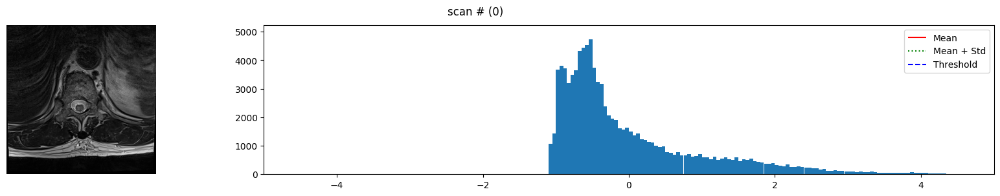

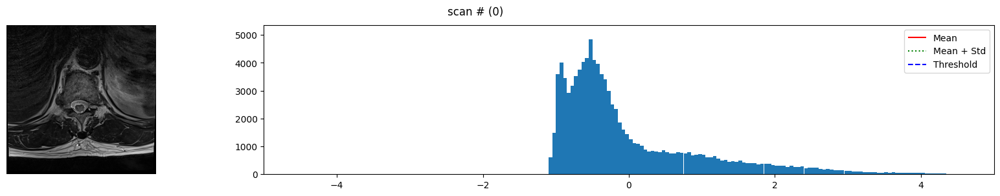

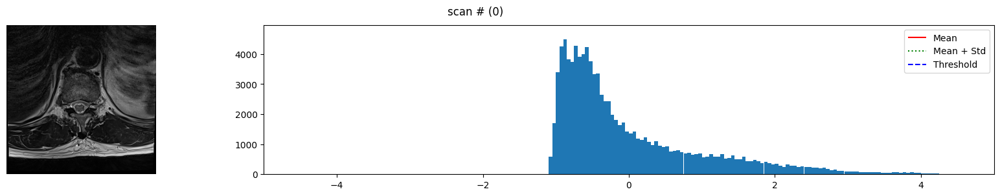

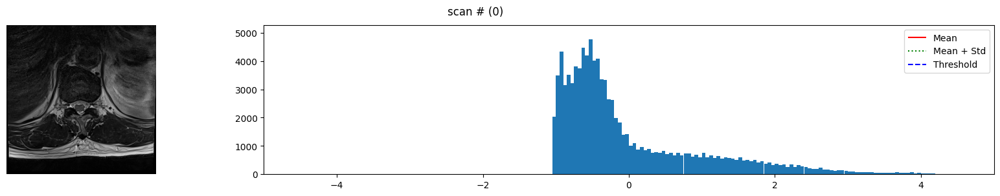

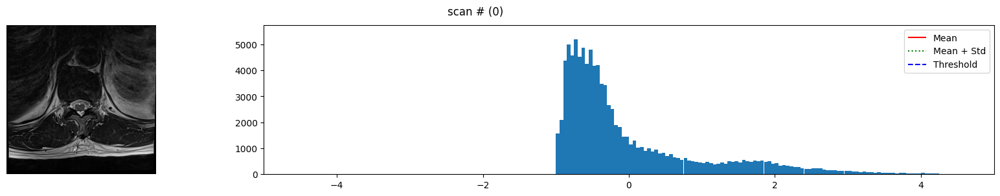

In [15]:
for img in flair_images[:5]:
    plot_image_hist(img)

In [16]:
dicom_files[1]

Dataset.file_meta -------------------------------
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Enhanced MR Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 100206310.1.2
(0002, 0010) Transfer Syntax UID                 UI: RLE Lossless
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'PYDICOM 2.4.2'
-------------------------------------------------
(0008, 0018) SOP Instance UID                    UI: 100206310.1.2
(0008, 0023) Content Date                        DA: '20240503'
(0008, 0033) Content Time                        TM: '223744.975695'
(0008, 103e) Series Description                  LO: 'T2'
(0010, 0020) Patient ID                          LO: '100206310'
(0018, 0050) Slice Thickness                     DS: '3.5'
(0018, 0088) Spacing Between Slices              DS: '3.5'
(0018, 5100) Patient Position             

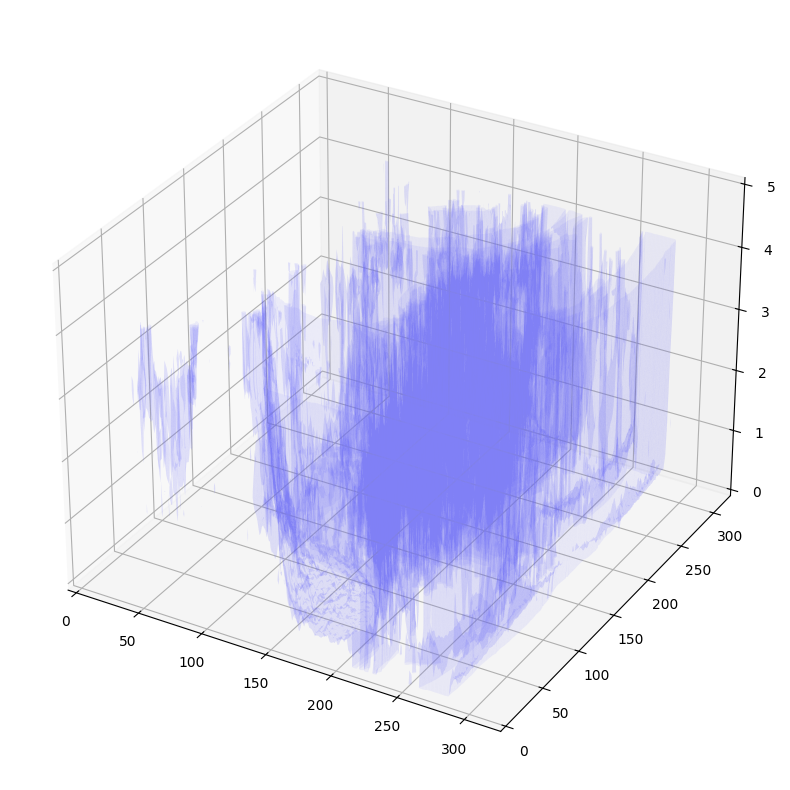

In [17]:
def load_dicom_images(folder_path, num_images=5):
    dicom_files = sorted([os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.dcm')])[:num_images]
    images = [pydicom.dcmread(f).pixel_array for f in dicom_files]
    return np.stack(images, axis=-1)

def plot_3d(image, threshold=-300):

    verts, faces, _, _ = measure.marching_cubes(image, level=threshold)  
    
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')    
    
    mesh = Poly3DCollection(verts[faces], alpha=0.1)
    face_color = [0.5, 0.5, 1]  # light blue
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)
    
    ax.set_xlim(0, image.shape[0])
    ax.set_ylim(0, image.shape[1])
    ax.set_zlim(0, image.shape[2])
    
    plt.show()


folder_path = "kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310/1012284084"
dicom_images = load_dicom_images(folder_path, num_images=5)
plot_3d(dicom_images, threshold=300)

In [18]:
def load_dicom_images(folder_path, num_images=5):
    dicom_files = sorted([os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.dcm')])[:num_images]
    images = [pydicom.dcmread(f).pixel_array for f in dicom_files]
    return np.stack(images, axis=-1)

def plot_3d_interactive(image, threshold=-300):    
    verts, faces, _, _ = measure.marching_cubes(image, level=threshold)   
    
    fig = go.Figure(data=[
        go.Mesh3d(
            x=verts[:, 0],
            y=verts[:, 1],
            z=verts[:, 2],
            i=faces[:, 0],
            j=faces[:, 1],
            k=faces[:, 2],
            color='blue',
            opacity=0.1
        )
    ])
    
    fig.update_layout(
        scene=dict(
            xaxis=dict(visible=True),
            yaxis=dict(visible=True),
            zaxis=dict(visible=True)
        ),
        width=800,
        height=800,
        title="Interactive 3D DICOM Image Visualization"
    )
    
    fig.show()


folder_path = "kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/1002894806/866293114"
dicom_images = load_dicom_images(folder_path, num_images=5)
plot_3d_interactive(dicom_images, threshold=100)

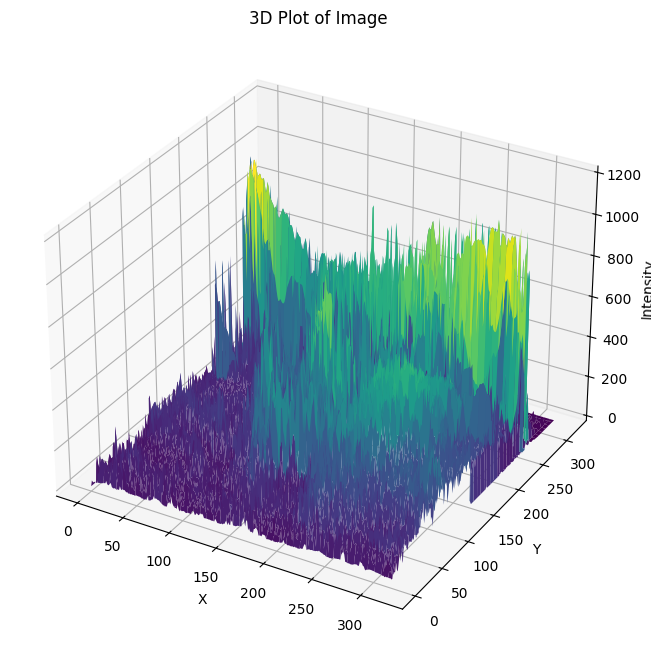

In [19]:
from mpl_toolkits.mplot3d import Axes3D

def plot_3d_image(image):   
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    rows, cols = image.shape
    x, y = np.meshgrid(np.arange(cols), np.arange(rows))
    ax.plot_surface(x, y, image, cmap='viridis', edgecolor='none')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Intensity')
    ax.set_title('3D Plot of Image')
    plt.show()
    
plot_3d_image(flair_images[0])

In [20]:
df_sub.head()


,row_id,normal_mild,moderate,severe
0,44036939_left_neural_foraminal_narrowing_l1_l2,0.333333,0.333333,0.333333
1,44036939_left_neural_foraminal_narrowing_l2_l3,0.333333,0.333333,0.333333
2,44036939_left_neural_foraminal_narrowing_l3_l4,0.333333,0.333333,0.333333
3,44036939_left_neural_foraminal_narrowing_l4_l5,0.333333,0.333333,0.333333
4,44036939_left_neural_foraminal_narrowing_l5_s1,0.333333,0.333333,0.333333


In [21]:
df_sub.shape,test_series.shape,train_series.shape,label_coordinates_df.shape,df_train.shape


((25, 4), (3, 3), (6294, 3), (48692, 7), (1975, 26))

In [22]:
test_series.head()


,study_id,series_id,series_description
0,44036939,2828203845,Sagittal T1
1,44036939,3481971518,Axial T2
2,44036939,3844393089,Sagittal T2/STIR


In [23]:
test_series.head()


,study_id,series_id,series_description
0,44036939,2828203845,Sagittal T1
1,44036939,3481971518,Axial T2
2,44036939,3844393089,Sagittal T2/STIR


In [24]:
train_series.head()


,study_id,series_id,series_description
0,4003253,702807833,Sagittal T2/STIR
1,4003253,1054713880,Sagittal T1
2,4003253,2448190387,Axial T2
3,4646740,3201256954,Axial T2
4,4646740,3486248476,Sagittal T1


In [25]:
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier


df_train_melted = df_train.melt(id_vars=['study_id'], var_name='condition_level', value_name='severity')
df_train_melted[['condition', 'level']] = df_train_melted['condition_level'].str.rsplit('_', n=1, expand=True)
le_severity = LabelEncoder()
df_train_melted['severity_encoded'] = le_severity.fit_transform(df_train_melted['severity'])
X_train = df_train_melted[['study_id', 'condition', 'level']]
y_train = df_train_melted['severity_encoded']
X_train = pd.get_dummies(X_train, columns=['condition', 'level'])
test_rows = []
for _, row in test_series.iterrows():
    for condition in ['left_neural_foraminal_narrowing', 'right_neural_foraminal_narrowing', 'left_subarticular_stenosis', 'right_subarticular_stenosis', 'spinal_canal_stenosis']:
        for level in ['l1_l2', 'l2_l3', 'l3_l4', 'l4_l5', 'l5_s1']:
            test_rows.append({
                'study_id': row['study_id'],
                'condition': condition,
                'level': level
            })

X_test = pd.DataFrame(test_rows)
X_test = pd.get_dummies(X_test, columns=['condition', 'level'])
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

In [26]:
X_train


,study_id,condition_left_neural_foraminal_narrowing_l1,condition_left_neural_foraminal_narrowing_l2,condition_left_neural_foraminal_narrowing_l3,condition_left_neural_foraminal_narrowing_l4,condition_left_neural_foraminal_narrowing_l5,condition_left_subarticular_stenosis_l1,condition_left_subarticular_stenosis_l2,condition_left_subarticular_stenosis_l3,condition_left_subarticular_stenosis_l4,...,condition_spinal_canal_stenosis_l1,condition_spinal_canal_stenosis_l2,condition_spinal_canal_stenosis_l3,condition_spinal_canal_stenosis_l4,condition_spinal_canal_stenosis_l5,level_l2,level_l3,level_l4,level_l5,level_s1
0,4003253,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,True,False,False,False,False
1,4646740,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,True,False,False,False,False
2,7143189,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,True,False,False,False,False
3,8785691,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,True,False,False,False,False
4,10728036,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49370,4282019580,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
49371,4283570761,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
49372,4284048608,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
49373,4287160193,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


In [27]:
model = RandomForestClassifier()
model.fit(X_train, y_train)

RandomForestClassifier()

In [28]:
predictions_proba = model.predict_proba(X_test)
predictions_df = pd.DataFrame(predictions_proba, columns=le_severity.classes_)
predictions_df['study_id'] = X_test['study_id'].values
predictions_df['condition_level'] = X_test.index.map(lambda idx: f"{test_rows[idx]['condition']}_{test_rows[idx]['level']}")
predictions_df['row_id'] = predictions_df['study_id'].astype(str) + '_' + predictions_df['condition_level']

In [29]:
df_sub1 = pd.read_csv('kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/sample_submission.csv')

In [30]:
normal_mild_value = (predictions_df['Normal/Mild'].iloc[0])
moderate_value = (predictions_df['Moderate'].iloc[0])
severe_value = (predictions_df['Severe'].iloc[0])

df_sub['normal_mild'] = normal_mild_value/2.3
df_sub['moderate'] =moderate_value*1.47
df_sub['severe'] =  (1-(normal_mild_value/2.3 +moderate_value*1.47))+severe_value-severe_value

In [31]:
df_sub.sample(4)


,row_id,normal_mild,moderate,severe
8,44036939_left_subarticular_stenosis_l4_l5,0.317391,0.3087,0.373909
11,44036939_right_neural_foraminal_narrowing_l2_l3,0.317391,0.3087,0.373909
23,44036939_spinal_canal_stenosis_l4_l5,0.317391,0.3087,0.373909
5,44036939_left_subarticular_stenosis_l1_l2,0.317391,0.3087,0.373909


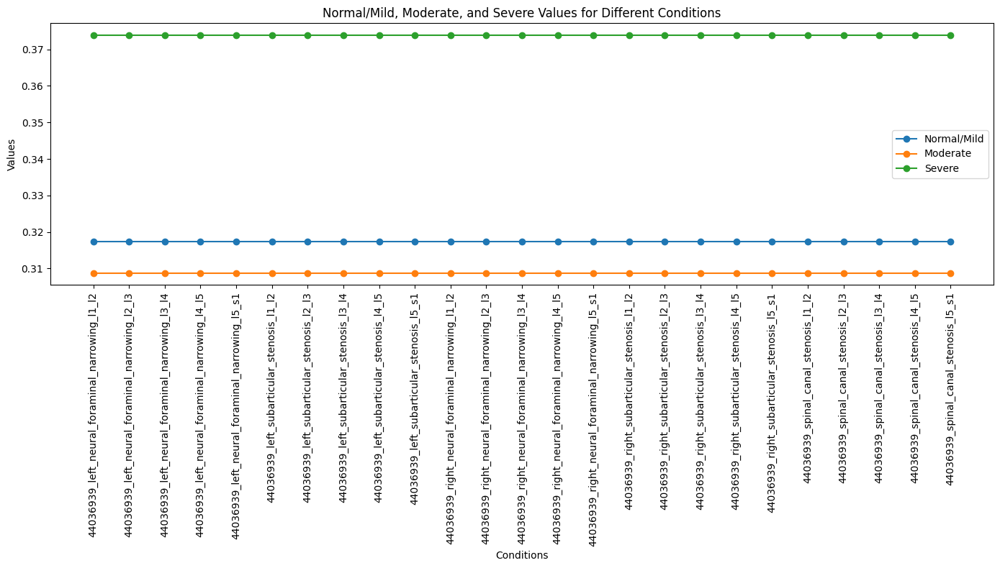

In [32]:
plt.figure(figsize=(14, 8))
plt.plot(df_sub['row_id'], df_sub['normal_mild'], label='Normal/Mild', marker='o')
plt.plot(df_sub['row_id'], df_sub['moderate'], label='Moderate', marker='o')
plt.plot(df_sub['row_id'], df_sub['severe'], label='Severe', marker='o')

plt.xlabel('Conditions')
plt.ylabel('Values')
plt.title('Normal/Mild, Moderate, and Severe Values for Different Conditions')
plt.xticks(rotation=90)
plt.legend()

plt.tight_layout()
plt.show()

In [33]:
df_sub.to_csv('submission.csv', index=False)
